# on-device AI
- Applications
  - real time speech detection
  - real time semantic segmentation
  - real time objection detection
  - on-device is everywhere: write, speak, drive, take photo or video, drones etc.
- Facts about on-device AI
  - when we click a piture on smartphone over 20+ AI models run in background.
  - ADAS (Advanced Driver Assistance is entirely on-device AI based).
- Use cases
  - Audio and Speech: Text-to-Speech, Speech Recognition etc
  - Images and Videos: Photo classification, scene detection, QR and Barcode detection, etc
  - Sensors: Keyboards, physical atctivity detection, etc.
- on-device and Generative AI
  - Live translation
  - Live transcription
  - Photo AI edition and Photo portrait generation
  - Semantic search
  - Text summarizaiton
  - Writing assistance
  - Visual Assistance

## Introduction


### Applications of on-device AI

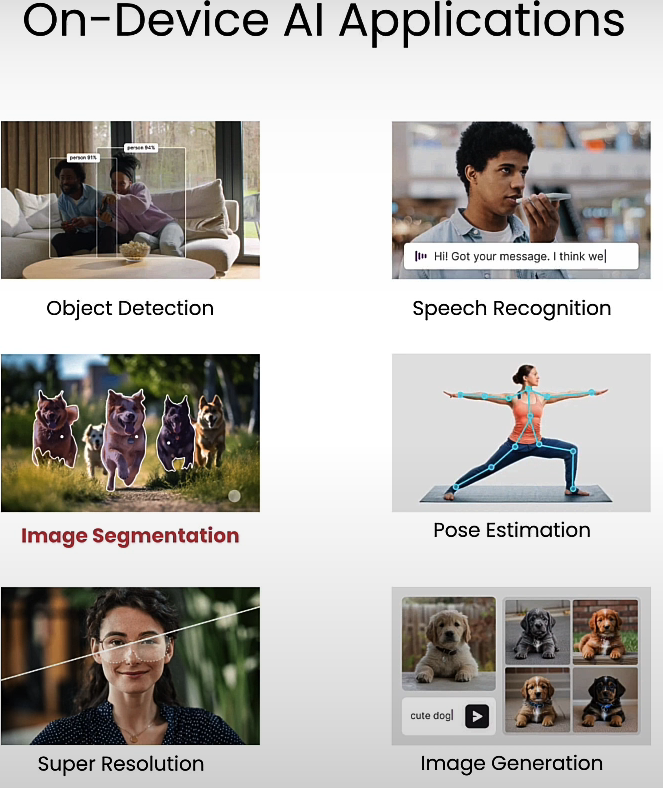

### Why on-device AI
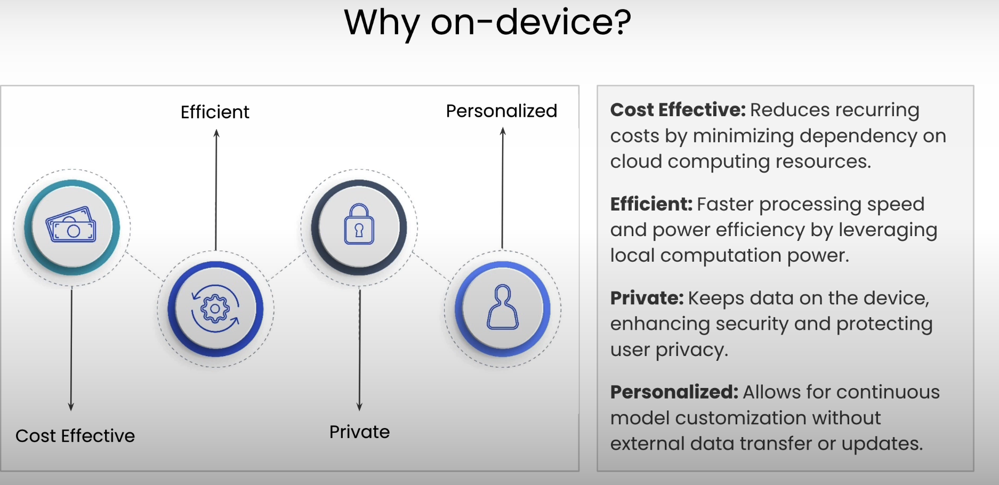

### Device in the loop deployment
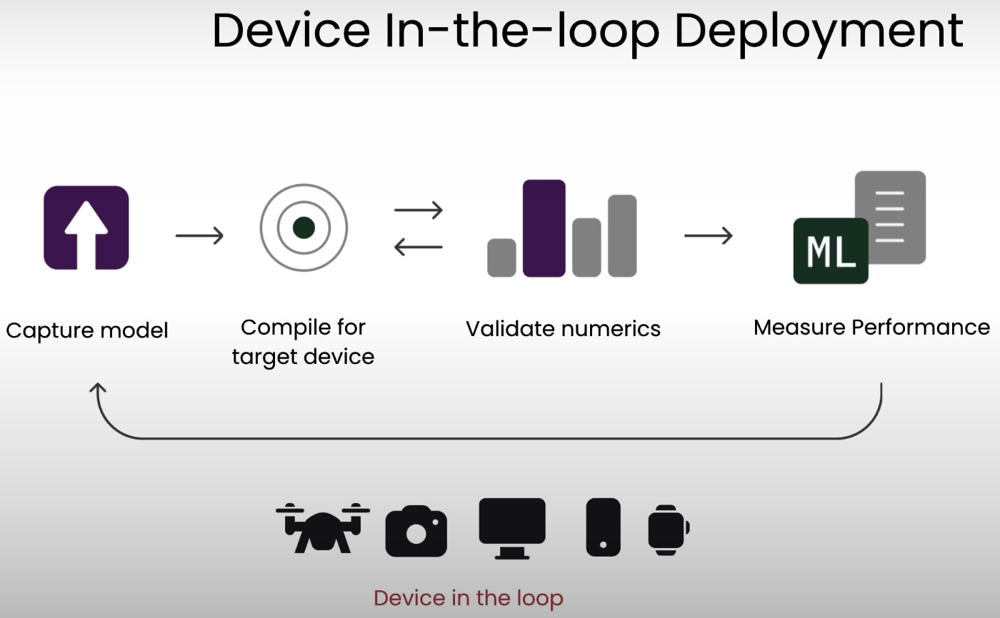

### Collection of on-device deployable models
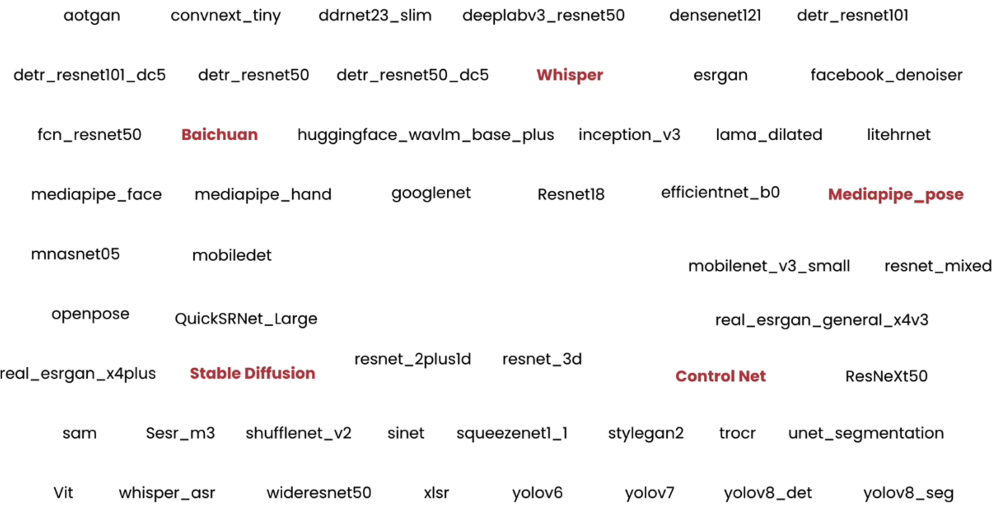

## Environment Setup

For documentation click here
https://aihub.qualcomm.com/get-started

In [18]:
# !pip3 install qai-hub
# !pip3 install "qai-hub[torch]"
# !pip3 install "qai-hub-models[ffnet_40s]"
# !pip install qai-hub-models
# !pip install torchinfo

## Deploying Segmentation models on-device

### What is Image Segmentation
Image segmentation divides the image into meaningful segments for easier identification and analysis.

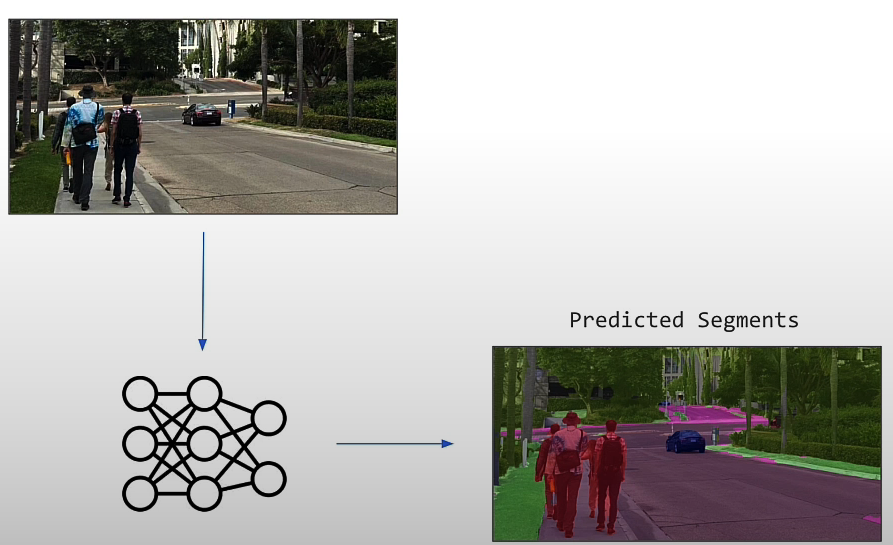

Types of Image segmentation
- Semantic Segmentation: Assigns a label to every pixel in an image for classifying entire objects and shapes
- Instance Segmentation: Distinguishes individual objects within the same category by labelling each instance separately.

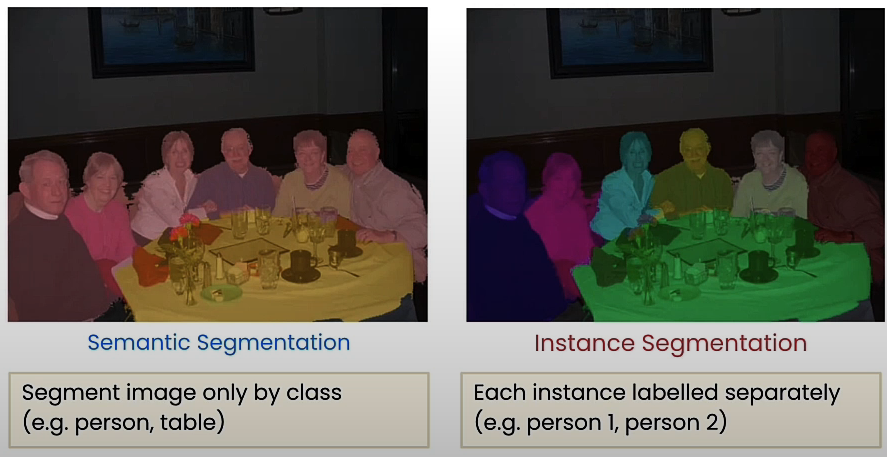

- The famous Semantic Segmentation Models/Algorithms: 
    - ResNet (Residual Network): Uses residual connections to enable training of very deep networks by allowing gradients to flow through layers without diminishing.
    - HRNet (High-Resolution Network): Maintains high-res representations through the network, enabling it to capture fine details for accurate segmentation.
    - FANet (Feature Agglomeration Network): Focuses on agglomerating features from different scales, enhancing the model's ability to discern finer details.
    - DDRNet (Dual Dynamic Resolution Network): Employs dual-path architectures to balance efficiency and accuracy, facilitating real-time semantic segmentation.

## Implementation of ffnet

#### Know about the ffnet model

In [13]:
from qai_hub_models.models.ffnet_40s import Model

In [16]:
from torchinfo import summary

In [17]:
# Load from pre-trained weights
model = Model.from_pretrained()
input_shape = (1, 3, 1024, 2048)
stats = summary(model, 
  input_size=input_shape, 
  col_names=["num_params", "mult_adds"]
)
print(stats)

100%|██████████████████████████████████████| 55.8M/55.8M [00:11<00:00, 4.91MB/s]


Done
cityscapes_segmentation requires repository https://github.com/Qualcomm-AI-research/FFNet.git . Ok to clone? [Y/n] 

 y


Cloning https://github.com/Qualcomm-AI-research/FFNet.git to /home/younis/.qaihm/models/cityscapes_segmentation/v2/Qualcomm-AI-research_FFNet_git...
Done
Loading pretrained model state dict from /home/younis/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights
Layer (type:depth-idx)                                       Param #                   Mult-Adds
FFNet40S                                                     --                        --
├─FFNet: 1-1                                                 --                        --
│    └─ResNetS: 2-1                                          --                        --
│    │    └─Conv2d: 3-1                                      864                       452,984,832
│    │    └─BatchNorm2d: 3-2                                 64                        64
│    │    └─ReLU: 3-3                                        --                        --
│    │    └─Conv2d: 3-4 

In [19]:
# other variants of ffnet
# High resolution variants
from qai_hub_models.models.ffnet_40s import Model
#from qai_hub_models.models.ffnet_54s import Model
#from qai_hub_models.models.ffnet_78s import Model

# Low resolution variants
low_res_input_shape = (1, 3, 512, 1024)
#from qai_hub_models.models.ffnet_78s_lowres import Model
#from qai_hub_models.models.ffnet_122ns_lowres import Model

model = Model.from_pretrained()
stats = summary(model, 
  input_size=input_shape, # use low_res_input_shape for low_res models
  col_names=["num_params", "mult_adds"]
)
print(stats)

Loading pretrained model state dict from /home/younis/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights
Layer (type:depth-idx)                                       Param #                   Mult-Adds
FFNet40S                                                     --                        --
├─FFNet: 1-1                                                 --                        --
│    └─ResNetS: 2-1                                          --                        --
│    │    └─Conv2d: 3-1                                      864                       452,984,832
│    │    └─BatchNorm2d: 3-2                                 64                        64
│    │    └─ReLU: 3-3                                        --                        --
│    │    └─Conv2d: 3-4                                      18,432                    2,415,919,104
│    │    └─BatchNorm2d: 3-5                                 128             

#### Setup AI Hub for device-in-the-loop deployment

In [21]:
import qai_hub

/home/younis/.local/lib/python3.10/site-packages/huggingface_hub/utils/_runtime.py:184: UserWarning: Pydantic is installed but cannot be imported. Please check your installation. `huggingface_hub` will default to not using Pydantic. Error message: '{e}'
  warnings.warn(


100%|█████████████████████████████████████████| 443k/443k [00:01<00:00, 332kB/s]


Done
Loading pretrained model state dict from /home/younis/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights
Running Inference on 0 samples


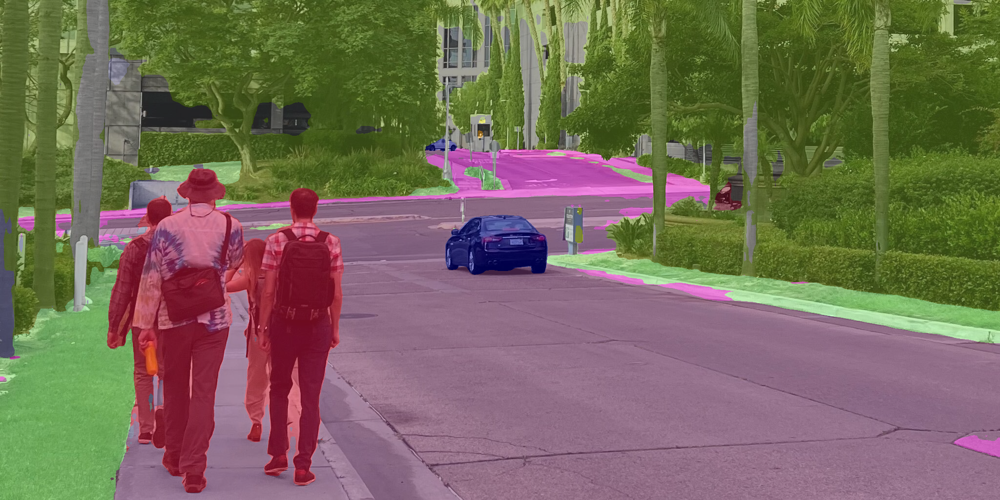

In [22]:
%run -m qai_hub_models.models.ffnet_40s.demo

In [23]:
## run on real smart phone
%run -m qai_hub_models.models.ffnet_40s.export -- --device "Samsung Galaxy S23"

Loading pretrained model state dict from /home/younis/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights
Optimizing model ffnet_40s to run on-device


Uploading model: 100%|█████████████████████| 53.6M/53.6M [00:28<00:00, 2.00MB/s]


Scheduled compile job (jz5w90j3p) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/jz5w90j3p/

Profiling model ffnet_40s on a hosted device.
Waiting for compile job (jz5w90j3p) completion. Type Ctrl+C to stop waiting at any time.
    ✅ SUCCESS                          
Scheduled profiling job (jmg9476w5) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/jmg9476w5/

Running inference for ffnet_40s on a hosted device with example inputs.


Uploading dataset: 100%|███████████████████| 21.5M/21.5M [00:16<00:00, 1.35MB/s]


Scheduled inference job (jnp18kr8g) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/jnp18kr8g/



job_jz5w90j3p_optimized_tflite_m9m50k09q.tflite: 100%|█| 53.1M/53.1M [00:13<00:0


Waiting for profile job (jmg9476w5) completion. Type Ctrl+C to stop waiting at any time.
    ✅ SUCCESS                          

------------------------------------------------------------
Performance results on-device for Ffnet_40S.
------------------------------------------------------------
Device                          : Samsung Galaxy S23 (13)
Runtime                         : TFLITE                 
Estimated inference time (ms)   : 23.3                   
Estimated peak memory usage (MB): [3, 63]                
Total # Ops                     : 92                     
Compute Unit(s)                 : NPU (92 ops)           
------------------------------------------------------------
More details: https://app.aihub.qualcomm.com/jobs/jmg9476w5/

Waiting for inference job (jnp18kr8g) completion. Type Ctrl+C to stop waiting at any time.
    ✅ SUCCESS                          


dataset-d67jzj3w2.h5: 100%|█████████████████| 1.22M/1.22M [00:03<00:00, 334kB/s]


Comparing on-device vs. local-cpu inference for Ffnet_40S.
+---------------+-------------------+--------+
| output_name   | shape             |   psnr |
+===============+===================+========+
| output_0      | (1, 19, 128, 256) |  62.96 |
+---------------+-------------------+--------+

- psnr: Peak Signal-to-Noise Ratio (PSNR). >30 dB is typically considered good.

More details: https://app.aihub.qualcomm.com/jobs/jnp18kr8g/


Compiling on-device model asset for ffnet_40s.
Running python -m qai_hub_models.models.ffnet_40s.export --device Samsung Galaxy S23 --target-runtime tflite

Loading pretrained model state dict from /home/younis/.qaihm/models/ffnet/v1/ffnet40S/ffnet40S_dBBB_cityscapes_state_dict_quarts.pth
Initializing ffnnet40S_dBBB_mobile weights
Optimizing model ffnet_40s to run on-device


Uploading model: 100%|█████████████████████| 53.6M/53.6M [00:29<00:00, 1.90MB/s]


Scheduled compile job (jqp4w6z1g) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/jqp4w6z1g/

Waiting for compile job (jqp4w6z1g) completion. Type Ctrl+C to stop waiting at any time.
    ✅ SUCCESS                          
Exported asset: job_jqp4w6z1g_optimized_tflite

Running Inference on 0 samples


Uploading dataset: 100%|████████████████████| 7.42M/7.42M [00:12<00:00, 638kB/s]


Scheduled inference job (j0px18wlg) successfully. To see the status and results:
    https://app.aihub.qualcomm.com/jobs/j0px18wlg/

Waiting for inference job (j0px18wlg) completion. Type Ctrl+C to stop waiting at any time.
    ✅ SUCCESS                          


dataset-dd9pgj5w9.h5: 100%|█████████████████| 1.32M/1.32M [00:09<00:00, 145kB/s]


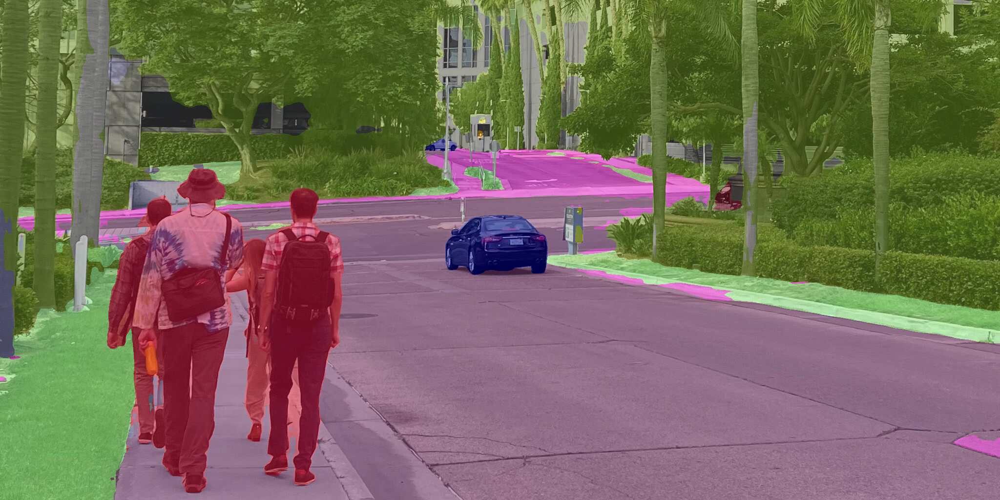

In [24]:
## This inference will came from real device
%run -m qai_hub_models.models.ffnet_40s.demo -- --device "Samsung Galaxy S23" --on-device